In [1]:
%load_ext autoreload
%autoreload 2

import sys
import os
import time

import numpy as np
try:
    import mxnet as mx
except:
    sys.stderr.write("Cannot import mxnet.\n")
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.ndimage.interpolation import map_coordinates
from skimage.exposure import rescale_intensity
from skimage.transform import rotate

sys.path.append(os.environ['REPO_DIR'] + '/utilities')
from utilities2015 import *
from metadata import *
from data_manager import *
from learning_utilities import *
from distributed_utilities import *
from visualization_utilities import *

/usr/local/lib/python2.7/dist-packages/matplotlib/__init__.py:1350: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)
No vtk


Setting environment for Precision WorkStation


In [2]:
from sklearn.externals import joblib

from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC, SVC
from sklearn.calibration import CalibratedClassifierCV
from sklearn.ensemble import GradientBoostingClassifier 

sys.path.append('/home/yuncong/csd395/xgboost/python-package')
try:
    from xgboost.sklearn import XGBClassifier
except:
    sys.stderr.write('xgboost is not loaded.')

xgboost is not loaded.

In [4]:
stack = 'MD661'
# stack = 'ChatCryoJane201710'

In [5]:
windowing_id = 5

windowing_properties = windowing_settings[windowing_id]
patch_size = windowing_properties['patch_size']
spacing = windowing_properties['spacing']
w, h = metadata_cache['image_shape'][stack]
half_size = patch_size/2

grid_spec = (patch_size, spacing, w, h)

sample_locations_ = grid_parameters_to_sample_locations(grid_spec=grid_spec)

In [6]:
contours_df = DataManager.load_annotation_v4(stack=stack, by_human=True, suffix='contours', timestamp='latest')
contours = contours_df[(contours_df['orientation'] == 'sagittal') & (contours_df['downsample'] == 1)]
# contours = contours.drop_duplicates(subset=['section', 'name', 'side', 'filename', 'downsample', 'creator'])
contours = contours.drop_duplicates(subset=['section', 'name', 'side', 'downsample', 'creator'])

aws s3 cp --recursive "s3://mousebrainatlas-data/CSHL_labelings_v3/MD661" "/home/yuncong/CSHL_labelings_v3/MD661" --exclude "*" --include "*contours*"
latest timestamp:  08022017175151


In [7]:
contours_df = convert_annotation_v3_original_to_aligned_cropped(contours, stack=stack, out_downsample=1)

download_from_s3(DataManager.get_thumbnail_mask_dir_v3(stack=stack, prep_id=2), is_dir=True)
contours_grouped = contours_df.groupby('section')

In [8]:
# Get bounding boxes for every structure on every section.

margin_um = 500

local_region_bboxes_allStructures_allSections = {structure: {} for structure in all_known_structures_sided}
for structure in all_known_structures_sided:
    name, side = parse_label(structure)[:2]
    if side is None:
        side = 'S'
    margin_pixel = margin_um / XY_PIXEL_DISTANCE_LOSSLESS
    q = contours_df[(contours_df['name'] == name) & (contours_df['side'] == side)]
    for cnt_id, cnt in q.iterrows():
        vs = cnt['vertices']
        xmin, ymin = vs.min(axis=0) 
        xmax, ymax = vs.max(axis=0)
        local_region_bboxes_allStructures_allSections[structure][cnt['section']] = (max(0, int(np.floor(xmin-margin_pixel))),
                                            min(w-1, int(np.ceil(xmax+margin_pixel))),
                                            max(0, int(np.floor(ymin-margin_pixel))),
                                            min(h-1, int(np.ceil(ymax+margin_pixel))))

In [9]:
local_region_bboxes_allStructures_allSections

{'10N_L': {209: (10802, 14726, 6231, 9058),
  214: (10932, 15346, 6449, 9253),
  215: (11024, 15424, 6372, 9268),
  235: (10746, 15640, 6472, 9458),
  239: (10540, 15263, 6374, 9253),
  241: (10593, 15052, 6405, 9277),
  245: (11309, 15346, 6635, 9118),
  249: (11349, 14551, 6671, 9126)},
 '10N_R': {},
 '12N': {209: (10742, 14549, 6709, 9677),
  214: (10721, 15323, 6709, 9892),
  215: (10798, 15456, 6693, 9930),
  220: (10321, 15495, 6824, 9948),
  225: (10774, 15394, 7114, 10010),
  230: (10720, 15313, 6810, 10029),
  235: (10719, 15443, 6785, 9987),
  239: (10566, 15399, 6776, 9917),
  241: (10884, 15318, 6876, 9868)},
 '3N_L': {},
 '3N_R': {},
 '4N_L': {},
 '4N_R': {},
 '5N_L': {138: (5539, 8728, 6995, 11119),
  145: (5782, 9236, 6914, 11561),
  152: (5766, 9546, 6911, 11253),
  273: (6198, 8980, 7262, 10437),
  275: (6140, 9344, 7194, 11132),
  282: (5562, 9203, 7310, 11544),
  290: (5586, 8853, 7277, 11209)},
 '5N_R': {},
 '6N_L': {199: (7450, 10118, 7622, 10326),
  200: (7426, 10

# Test Yoav's normalization idea
Using regions around a given landmark. Goal is to see if such normalization makes the brightness similar.

In [52]:
structure_to_inspect = 'SNR_L'

In [86]:
from distributed_utilities import *

In [96]:
img_blue_local_region_allSections = {}

for sec, (roi_xmin, roi_xmax, roi_ymin, roi_ymax) in local_region_bboxes_allStructures_allSections[structure_to_inspect].items():
    roi_w = roi_xmax + 1 - roi_xmin
    roi_h = roi_ymax + 1 - roi_ymin
    
#     img_blue_fp = DataManager.get_image_filepath_v2(stack=stack, section=sec, prep_id=2, resol='lossless', version='Ntb')
    
    img_blue_fp = DataManager.get_image_filepath_v2(stack=stack, section=sec, prep_id=2, resol='lossless')
    download_from_s3(img_blue_fp)
    
    img_blue_local_region_allSections[sec] = crop_large_image(fp=img_blue_fp, bbox=(roi_xmin-666,roi_xmax+666,roi_ymin-666,roi_ymax+666))[...,2]

convert "/media/yuncong/BstemAtlasData/CSHL_data_processed/MD661/MD661_prep2_lossless/MD662&661-F55-2017.06.22-17.33.34_MD661_1_0163_prep2_lossless.tif" -crop 5854x6500+1127+5843 /tmp/tmp.tif
convert "/media/yuncong/BstemAtlasData/CSHL_data_processed/MD661/MD661_prep2_lossless/MD662&661-F114-2017.06.07-03.45.47_MD661_1_0340_prep2_lossless.tif" -crop 5698x6117+786+6058 /tmp/tmp.tif
rm -rf "/media/yuncong/BstemAtlasData/CSHL_data_processed/MD661/MD661_prep2_lossless/MD662&661-F45-2017.06.05-22.05.50_MD661_1_0133_prep2_lossless.tif" && mkdir -p "/media/yuncong/BstemAtlasData/CSHL_data_processed/MD661/MD661_prep2_lossless"
aws s3 cp "s3://mousebrainatlas-data/CSHL_data_processed/MD661/MD661_prep2_lossless/MD662&661-F45-2017.06.05-22.05.50_MD661_1_0133_prep2_lossless.tif" "/media/yuncong/BstemAtlasData/CSHL_data_processed/MD661/MD661_prep2_lossless/MD662&661-F45-2017.06.05-22.05.50_MD661_1_0133_prep2_lossless.tif"
convert "/media/yuncong/BstemAtlasData/CSHL_data_processed/MD661/MD661_prep2_

In [97]:
titles = ["sec=%d"%sec for sec, im in sorted(img_blue_local_region_allSections.items())]
imgs = [im for sec, im in sorted(img_blue_local_region_allSections.items())]

In [98]:
img_normalized_local_region_allSections = {sec: (im - im.mean()) / im.std() 
                                           for sec, im in img_blue_local_region_allSections.iteritems()}

In [99]:
imgs_normalized = [im for sec, im in sorted(img_normalized_local_region_allSections.items())]

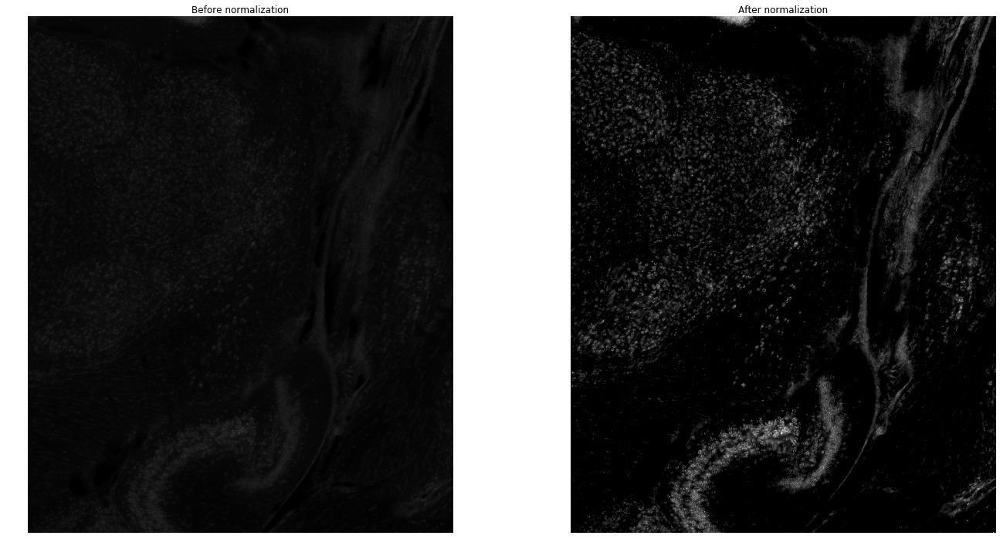

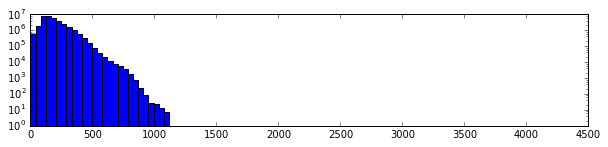

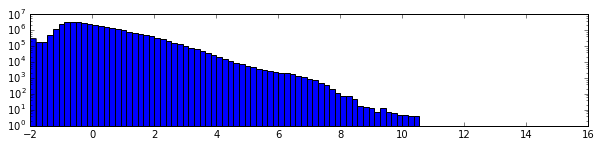

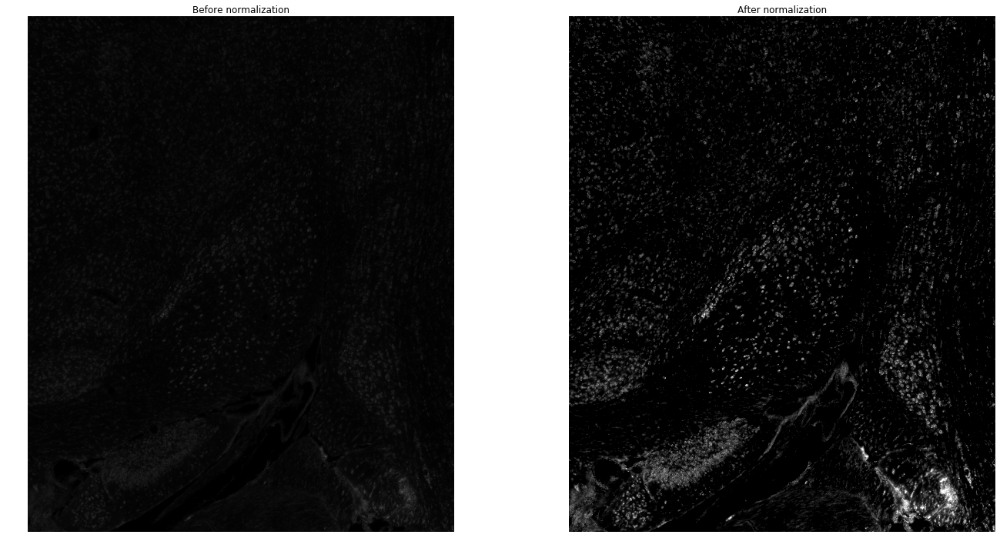

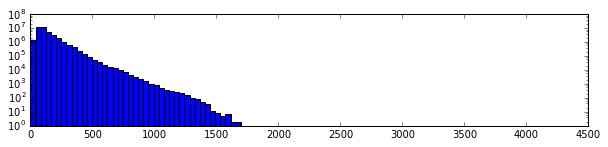

...

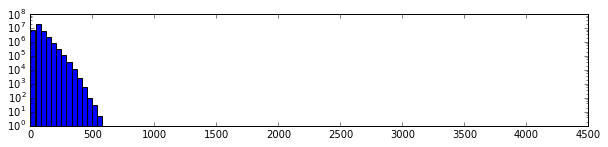

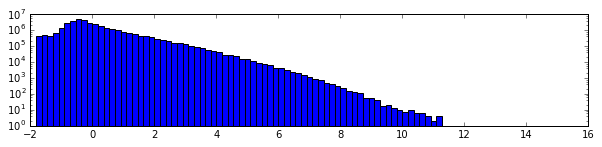

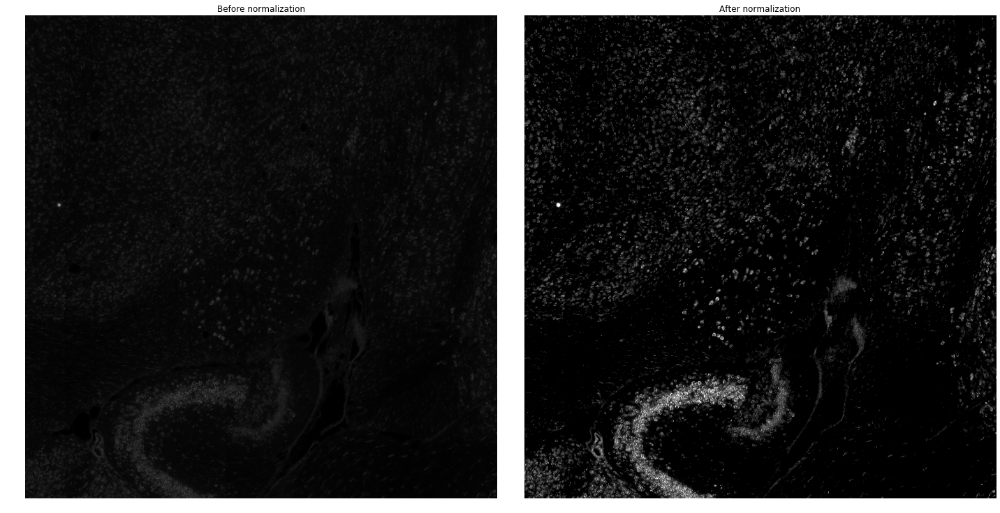

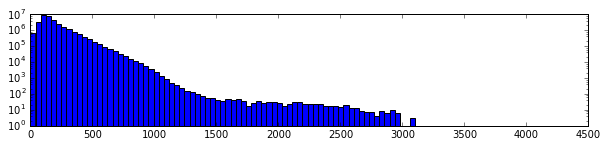

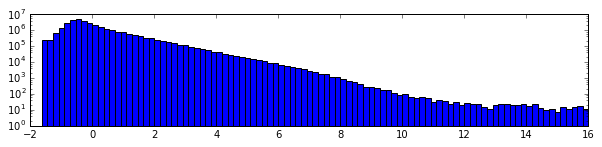

In [104]:
# from mpl_toolkits.axes_grid1 import make_axes_locatable

for im in imgs[::3]:
#     plt.figure(figsize=(10, 10))
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
#     plt.imshow(im, vmin=0, vmax=65535, cmap=plt.cm.gray)
    
    ax = axes[0]
    ax.imshow(im, vmin=0, vmax=2**12, cmap=plt.cm.gray)
#     divider = make_axes_locatable(ax)
#     cax = divider.append_axes("right", size="5%", pad=0.05)
#     plt.colorbar(im, cax=cax)
    ax.set_axis_off()
    ax.set_title('Before normalization')
    
    mu = im.mean()
    sigma = im.std()
    im_normalized = (im-mu)/sigma
    
#     ax = plt.gca()
    ax = axes[1]
    ax.imshow(im_normalized, vmin=0, vmax=9, cmap=plt.cm.gray)
#     im = ax.imshow(im_normalized, vmin=0, vmax=9, cmap=plt.cm.gray)
#     divider = make_axes_locatable(ax)
#     cax = divider.append_axes("right", size="5%", pad=0.05)
#     plt.colorbar(im, cax=cax)
    
    ax.set_axis_off()
    ax.set_title('After normalization')
    
    plt.tight_layout();
    plt.show()
    
    #######################
    
    plt.figure(figsize=(10,2))
    plt.hist(im.flatten(), bins=np.linspace(0, 2**12, 100), log=True);
    plt.show()
    
    plt.figure(figsize=(10,2))
    plt.hist(im_normalized.flatten(), bins=np.linspace(-2, 16, 100), log=True);
    plt.show()

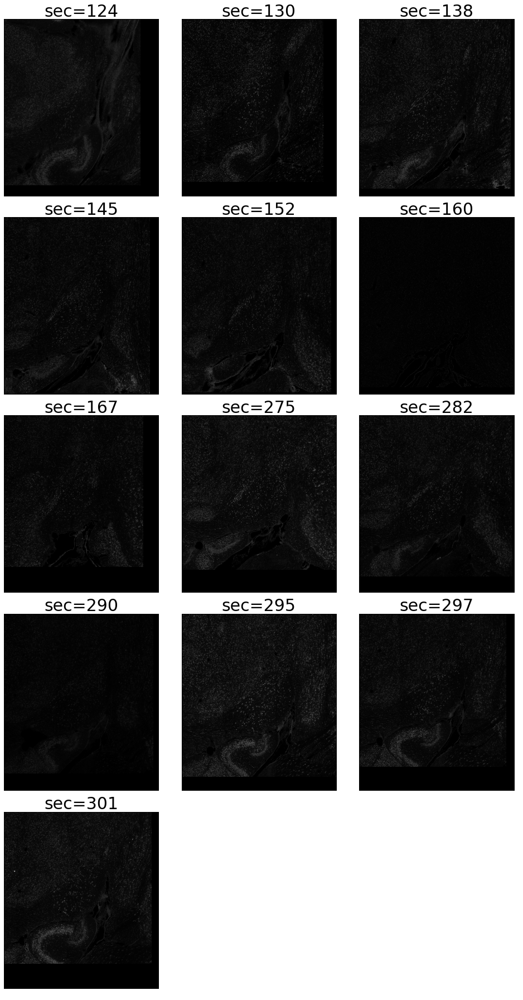

In [105]:
display_images_in_grids(imgs, nc=3, titles=titles, vmin=0, vmax=3000, cmap=plt.cm.gray)

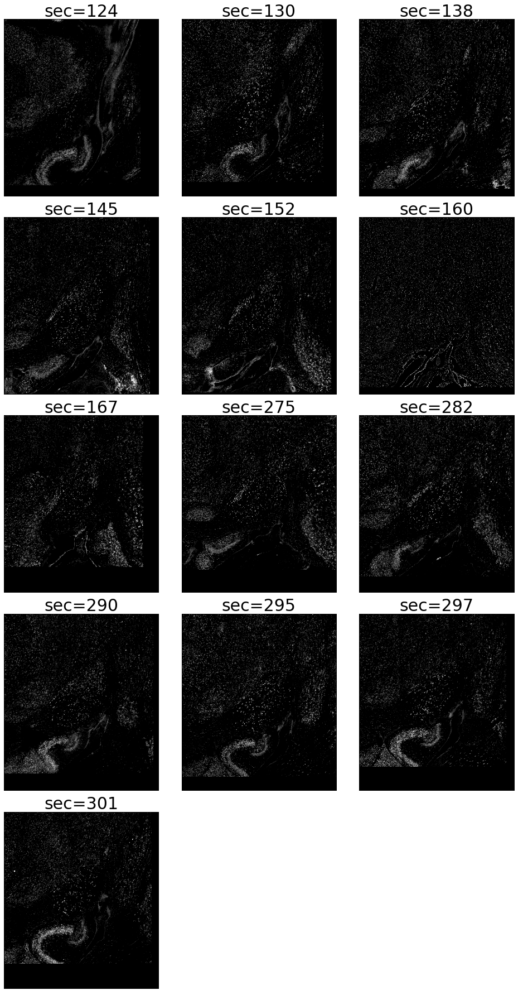

In [106]:
display_images_in_grids(imgs_normalized, nc=3, titles=titles, vmin=0, vmax=9, cmap=plt.cm.gray)

-176.273724211 341.238102478


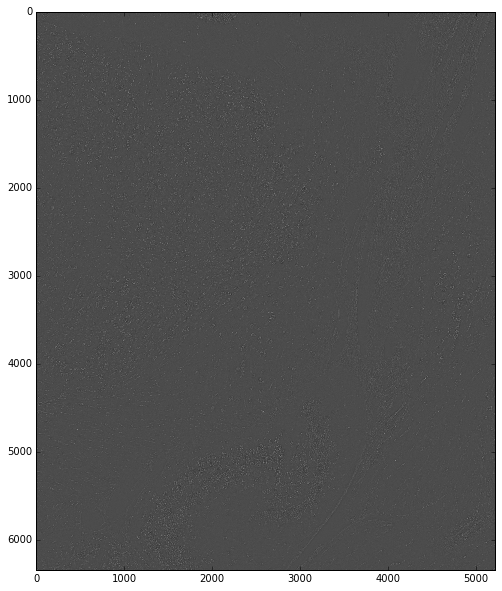

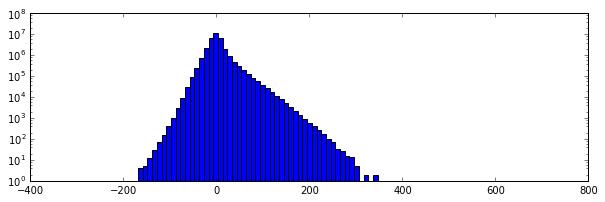

-269.980459057 568.999866953


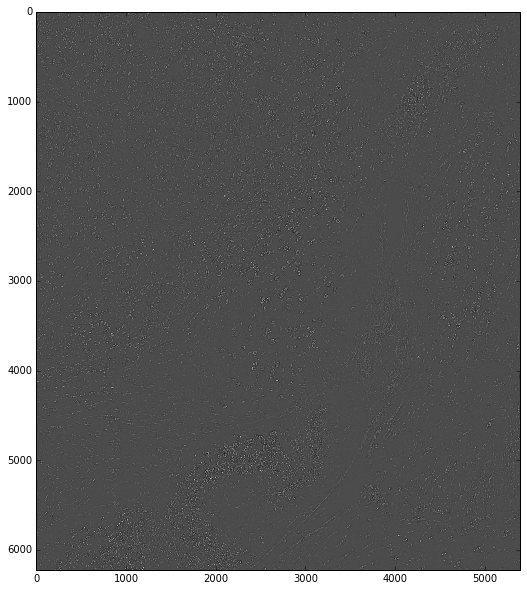

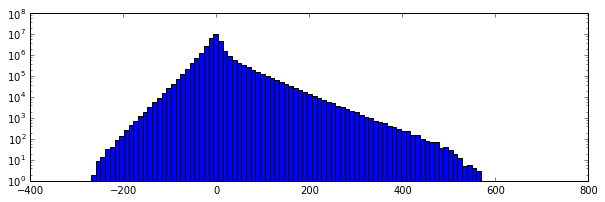

-237.57541396 536.193995029


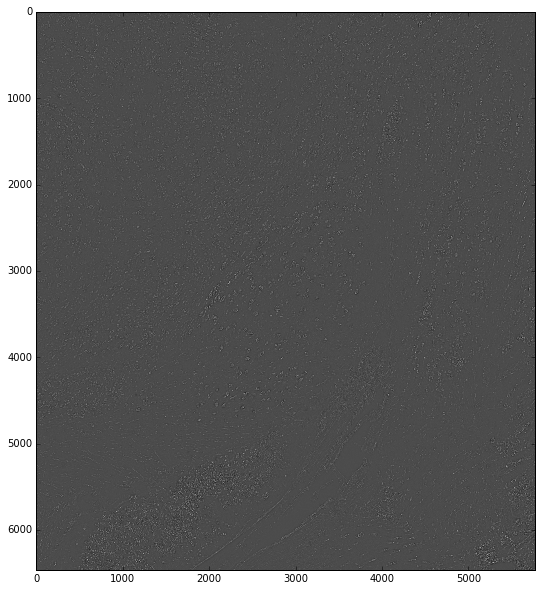

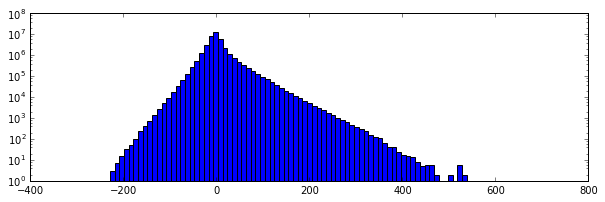

-204.902128513 636.846345279


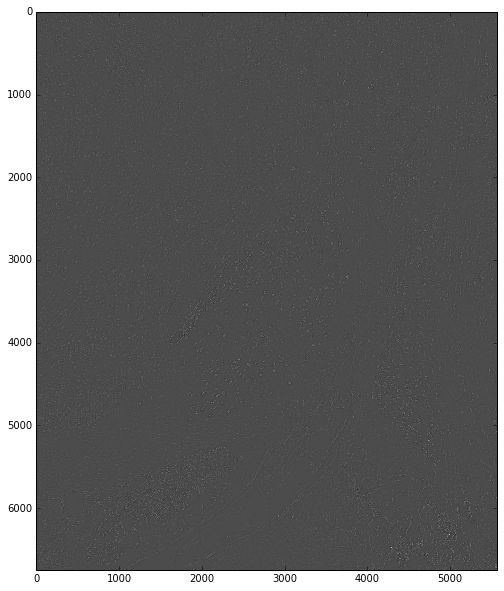

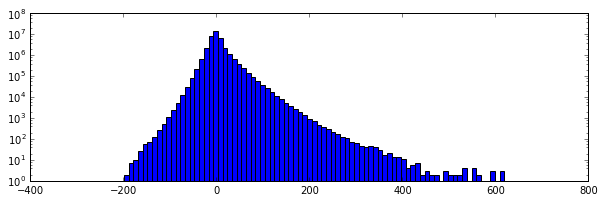

-253.608969954 656.14081565


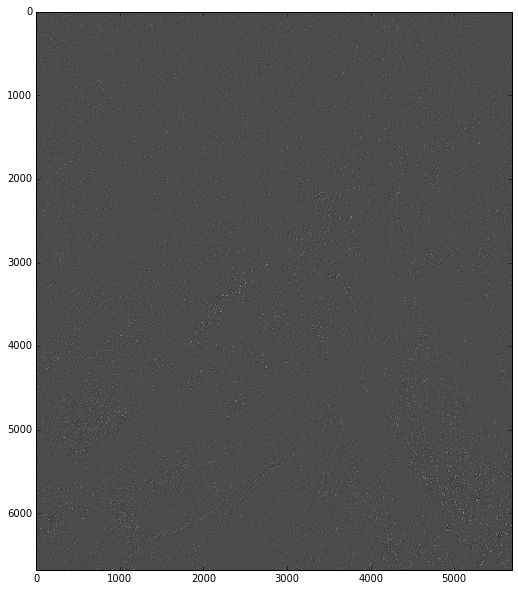

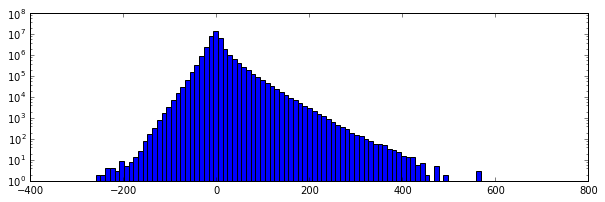

-117.745494965 278.539574871


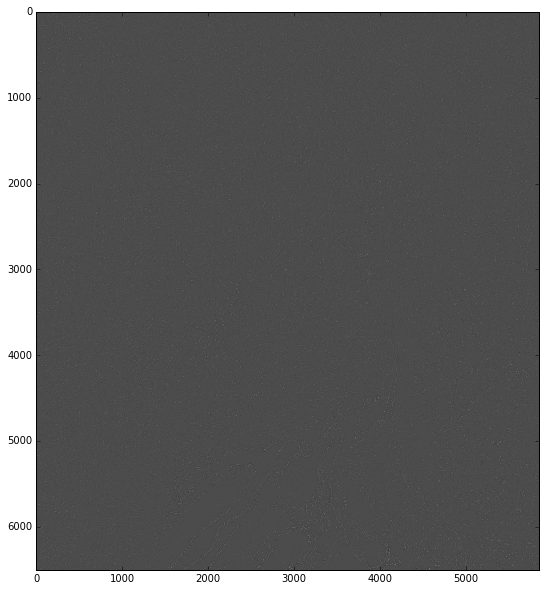

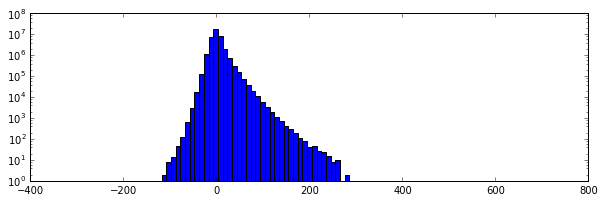

-204.562843812 468.884860779


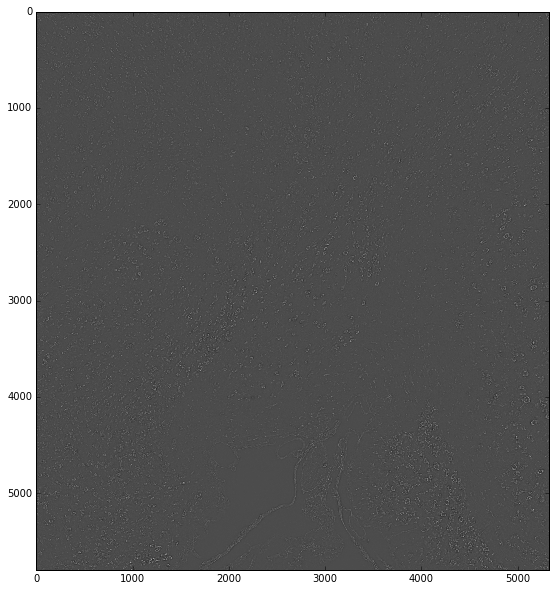

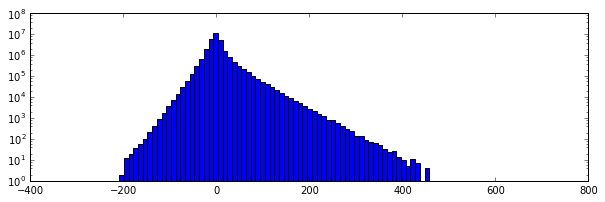

-228.991064045 707.695554317


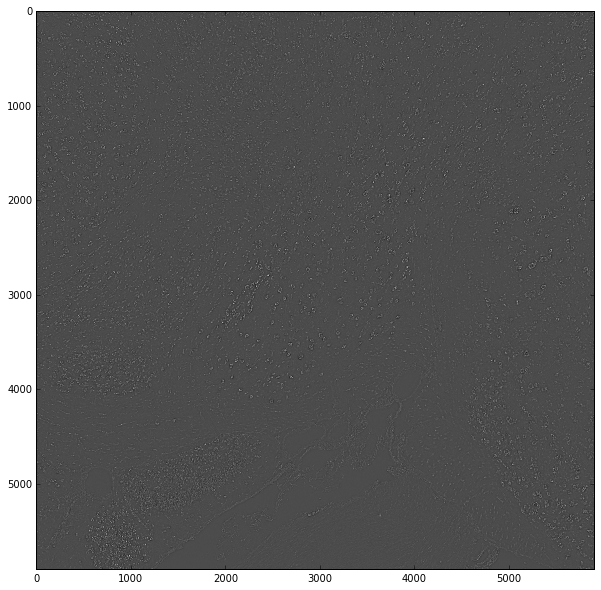

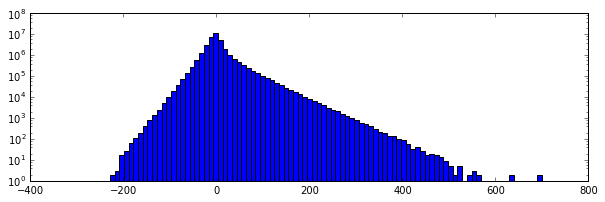

-179.352548576 594.135284067


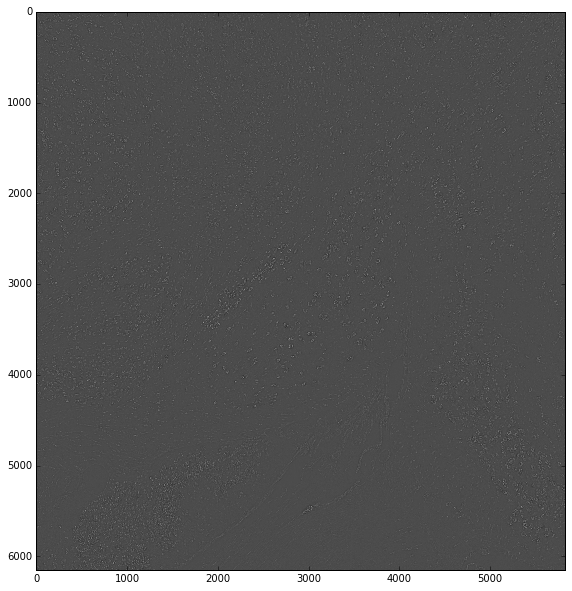

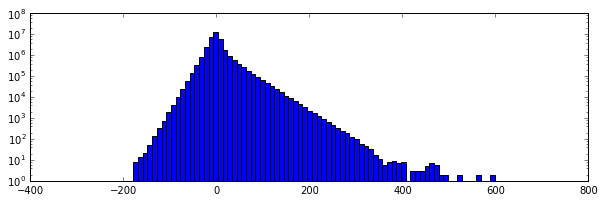

-91.0872815877 171.128922067


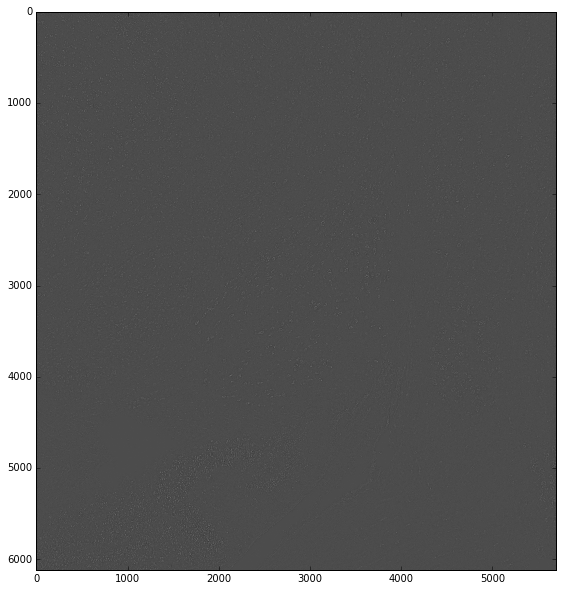

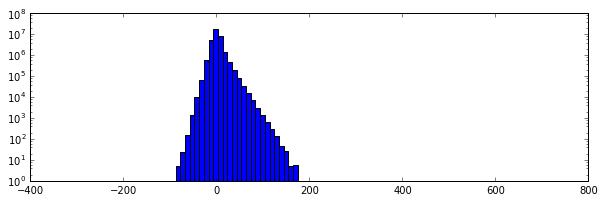

-285.913966995 538.834446663


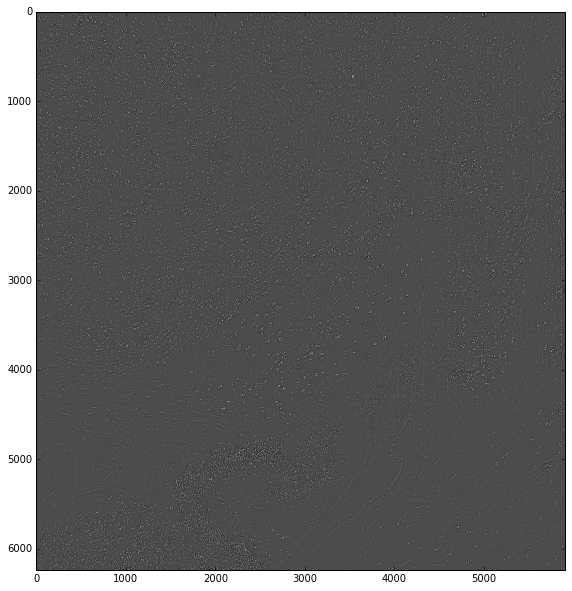

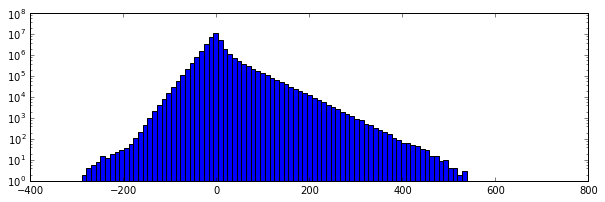

-192.393627485 444.333292978


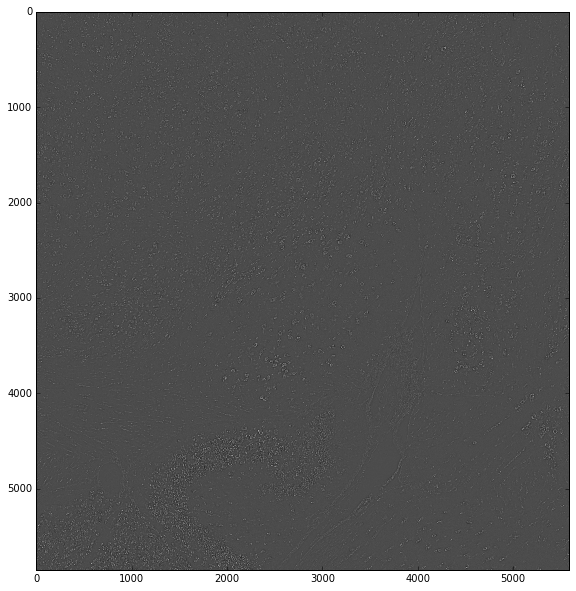

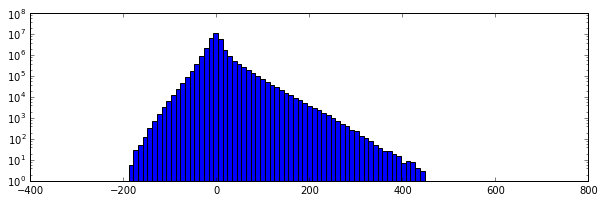

-273.161219243 709.151773436


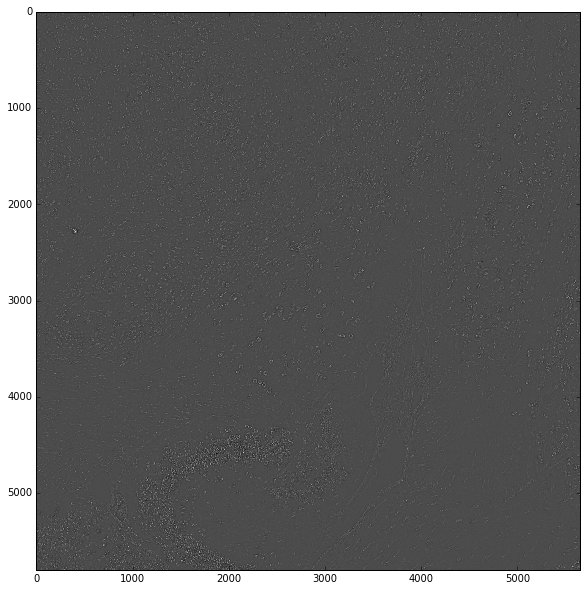

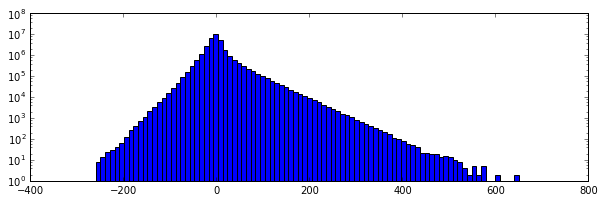

In [126]:
for img in imgs:
    
    lowpass = gaussian(img.astype(np.float), 5)
    gauss_highpass = img - lowpass

    print gauss_highpass.min(), gauss_highpass.max()
    
    plt.figure(figsize=(10, 10));
    plt.imshow(gauss_highpass, vmin=-300, vmax=700, cmap=plt.cm.gray);
    plt.axis('equal');
    plt.show();
    
    plt.figure(figsize=(10, 3));
    plt.hist(gauss_highpass.flatten(), bins=np.linspace(-300,700,100), log=True);
    plt.show();